### This notebook plots MHW features over time (ocetrac output) as a multiple column subplot and a single MHW feature

#### Load libraries

In [2]:
#data stuff
import xarray as xr
import numpy as np
import pandas as pd
#import dask.array as da
import dask

#date stuff
import warnings
warnings.filterwarnings('ignore')
from datetime import date
import cftime

#Plotting libraries
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.ticker as ticker
import cmocean.cm as cmo
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.font_manager import FontProperties
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import seaborn as sns
import cmocean

print('loaded libraries')

loaded libraries


In [3]:
hfdrake_path = "/pub/hfdrake/datasets/CM4_MHW_blobs/"
dir_path = "/pub/mariant3/WarmWaterMasses/data/ocetracv6/ocetrac-v6-processed/"

### Loading all data needed to make MHW evolution plot

In [3]:
ds = xr.open_dataset(f"{hfdrake_path}/data/ocean_daily_cmip.01860101-01901231.tos.nc", chunks={'time':100})
static = xr.open_dataset(f"{hfdrake_path}/data/ocean_daily_cmip.static.nc")
ds_region = ds.sel(xh=slice(-130, -70), yh=slice(8, 38))
static_region = static.sel(xh=slice(-130, -70), yh=slice(8, 38))
ds_static_region = xr.merge([static_region,ds_region])

In [17]:
ocetrac_labels = xr.open_mfdataset(f"{dir_path}ocetrac-v6-blobs-tos-t1*.nc", chunks={'time':1}).load()

In [5]:
blobs = xr.open_mfdataset(f"/pub/mariant3/WarmWaterMasses/data/ocetracv6/ocetrac-v6-blobs-tos-t1*.nc").labels.load()#,chunks={'time':1})
blobs

<xarray.DataArray 'labels' (time: 1100, yh: 1080, xh: 1440)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) object 0186-03-15 12:00:00 ... 0189-12-14 12:00:00
  * xh       (xh) float64 -299.7 -299.5 -299.2 -299.0 ... 59.53 59.78 60.03
  * yh       (yh) float64 -80.39 -80.31 -80.23 -80.15 ... 89.73 89.84 89.95
Attributes:
    initial objects identified:  27283
    final objects tracked:       1950
    radius:                      1
    size quantile threshold:     0.0
    min area:                    1.0
    percent area reject:         0.0031751945748440327
    percent area accept:         0.996824805425156

In [18]:
labels = ocetrac_labels.blobs
labels.load();

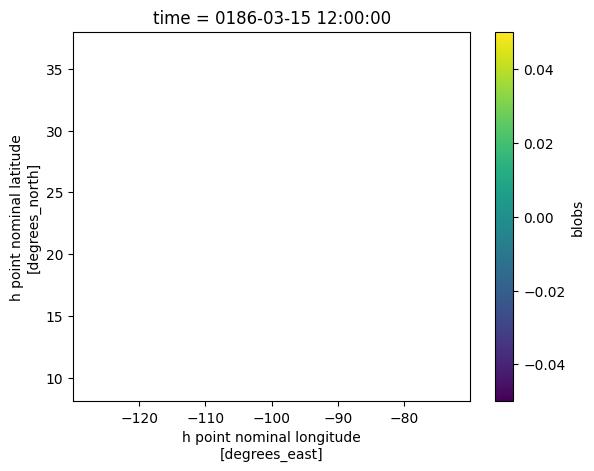

In [8]:
labels.isel(time=0).plot()

In [20]:
blobs

<xarray.DataArray 'labels' (time: 1100, yh: 1080, xh: 1440)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) object 0186-03-15 12:00:00 ... 0189-12-14 12:00:00
  * xh       (xh) float64 -299.7 -299.5 -299.2 -299.0 ... 59.53 59.78 60.03
  * yh       (yh) float64 -80.39 -80.31 -80.23 -80.15 ... 89.73 89.84 89.95
Attributes:
    initial objects identified:  27283
    final objects tracked:       1950
    radius:                      1
    size quantile threshold:     0.0
    min area:                    1.0
    percent area reject:         0.0031751945748440327
    percent area accept:         0.996824805425156

In [10]:
globalids = np.unique(blobs)

In [11]:
globalids = np.array([id for id in globalids if ~np.isnan(id)])

In [12]:
globalids

array([1.000e+00, 2.000e+00, 3.000e+00, ..., 2.048e+03, 2.049e+03,
       2.050e+03])

In [14]:
for id in globalids:
    print(id)

1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
11.0
12.0
13.0
14.0
15.0
16.0
17.0
18.0
19.0
20.0
21.0
22.0
23.0
24.0
25.0
26.0
27.0
28.0
29.0
30.0
31.0
32.0
33.0
34.0
35.0
36.0
37.0
38.0
39.0
40.0
41.0
42.0
43.0
44.0
45.0
46.0
47.0
48.0
49.0
50.0
51.0
52.0
53.0
54.0
55.0
56.0
57.0
58.0
59.0
60.0
61.0
62.0
63.0
64.0
65.0
66.0
67.0
68.0
69.0
70.0
71.0
72.0
73.0
74.0
75.0
76.0
77.0
78.0
79.0
80.0
81.0
82.0
83.0
84.0
85.0
86.0
87.0
88.0
89.0
90.0
91.0
92.0
93.0
94.0
95.0
96.0
97.0
98.0
99.0
100.0
101.0
102.0
103.0
104.0
105.0
106.0
107.0
108.0
109.0
110.0
111.0
112.0
113.0
114.0
115.0
116.0
117.0
118.0
119.0
120.0
121.0
122.0
123.0
124.0
125.0
126.0
127.0
128.0
129.0
130.0
131.0
132.0
133.0
134.0
135.0
136.0
137.0
138.0
139.0
140.0
141.0
142.0
143.0
144.0
145.0
146.0
147.0
148.0
149.0
150.0
151.0
152.0
153.0
154.0
155.0
156.0
157.0
158.0
159.0
160.0
161.0
162.0
163.0
164.0
165.0
166.0
167.0
168.0
169.0
170.0
171.0
172.0
173.0
174.0
175.0
176.0
177.0
178.0
179.0
180.0
181.0
182.0
183.0
184.0
185.

In [19]:
#These are all the IDs (labels) in the region
ids = np.unique(labels.sel(xh = slice(-130, -70), yh=slice(8, 38)))
ids = np.array([id for id in ids if ~np.isnan(id)])
ids

array([  39.,  136.,  210., ..., 7608., 7626., 7645.])

In [ ]:
#ids186 are the unique events in one year
year = "0186"
ids186 = np.unique(labels.sel(time=slice(f'{year}',f'{year}')))
ids186 = np.array([id for id in ids186 if ~np.isnan(id)])
ids186

In [ ]:
event_label =107 #231 is a GoM event, event 26
blob = labels.where(labels==event_label, drop=True)


blob.where(blob.plot(col="time", col_wrap=6))
#blob.plot(col="time", col_wrap=6)
#event.plot.contour()

#plt.show()

In [27]:
def plot_time_series(labels, start_time, end_time, num_cols=5, cmap=None, figsize=(20, 5),subplot_title_fontsize=12,colorbar_title='Colorbar',colorbar_title_fontsize=12,font_type='sans-serif',save_path=None):
    
    num_plots = end_time - start_time  
    num_rows = (num_plots + num_cols - 1) // num_cols  

    
    # Get the min and max values across all the time indices to normalize the color map
    ids_sel = np.unique(labels.isel(time=slice(start_time, end_time)))
    ids_sel = np.array([id for id in ids_sel if ~np.isnan(id)])
    vmin = np.min(ids_sel).astype(int)
    vmax = np.max(ids_sel).astype(int)
    back_color='w'#'#faf8eb'
    
         # Create a custom colormap with three colors if cmap is None
    if cmap is None:
        cmap = ListedColormap(np.random.random(size=(vmax, 3)).tolist())

    fig, axes = plt.subplots(num_rows, num_cols, subplot_kw={'projection': ccrs.PlateCarree()}, figsize=figsize,facecolor=back_color)
    
    font_properties = FontProperties(family=font_type, size=subplot_title_fontsize)
    
    for i, time_index in enumerate(range(start_time, end_time)):
        row = i // num_cols  # Calculate the row index
        col = i % num_cols  # Calculate the column index
        ax = axes[row, col]
        
        c = labels.isel(time=time_index).plot(ax=ax, transform=ccrs.PlateCarree(), add_colorbar=False, cmap=cmap, vmin=vmin, vmax=vmax)
        ax.coastlines()
        # ax.add_feature(cfeature.BORDERS, linestyle=':')
        # ax.gridlines(draw_labels=True)
        ax.set_xlim([-130, -70])
        ax.set_ylim([8, 38])
        date = labels.isel(time=time_index).time.dt.strftime('%Y-%m-%d').values
        ax.set_title(f'Time: {date}',fontproperties=font_properties)
        ax.set_facecolor(back_color)

    # Add colorbar with custom ticks
        
        #cbar = plt.colorbar(c, ax=ax)
        #cbar.set_ticks([])
       # cbar.set_label(colorbar_title, fontsize=colorbar_title_fontsize,fontproperties=FontProperties(family=font_type, size=colorbar_title_fontsize))
    # cbar = plt.colorbar(c, ax=axes.ravel().tolist(), ticks=[25])
    # cbar.set_label(colorbar_title, fontsize=colorbar_title_fontsize, fontproperties=FontProperties(family=font_type, size=colorbar_title_fontsize))
    
   
            
        # cbar = plt.colorbar(c, ax=ax, ticks=np.arange(vmin, vmax + 1, 1))
        # cbar.ax.yaxis.set_major_locator(ticker.MultipleLocator(1))
        # cbar.ax.yaxis.set_minor_locator(ticker.MultipleLocator(1))
        # cbar.set_label(colorbar_title, fontsize=colorbar_title_fontsize,fontproperties=FontProperties(family=font_type, size=colorbar_title_fontsize))
        # cbar.ax.tick_params(labelsize=14)

    # Hide any unused subplots
    for j in range(i + 1, num_rows * num_cols):
        fig.delaxes(axes.flat[j])

    plt.tight_layout()
    
    if save_path:
        plt.savefig('/pub/mariant3/WarmWaterMasses/figures/MHW-ocetrac-v5-t2-r1-msq75-labels-region-0186.png', bbox_inches='tight')

    #126
    plt.show()

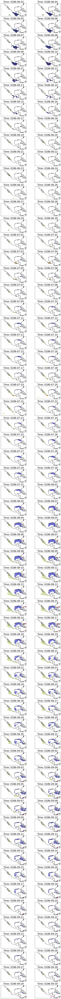

In [29]:
plot_time_series(labels, 80, 200,cmap="tab20b",num_cols=2,figsize=(9, 120),subplot_title_fontsize=20, colorbar_title='MHW Label', colorbar_title_fontsize=30,save_path=True)

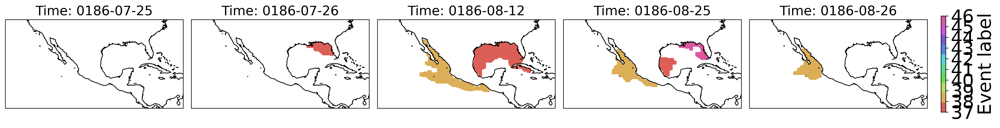

In [116]:
days = ['0186-07-25','0186-07-26', '0186-08-12', '0186-08-25', '0186-08-26']

ids_sel = np.unique(labels.sel(time=slice(days[0], days[-1])))
ids_sel = np.array([id for id in ids_sel if ~np.isnan(id)])
vmin = np.min(ids_sel).astype(int)
vmax = np.max(ids_sel).astype(int)
cmap = ListedColormap(sns.color_palette("hls", vmax - vmin + 1))

fig, axes = plt.subplots(
    ncols=5, figsize=(20, 10), dpi=300, subplot_kw={'projection': ccrs.PlateCarree()}
)
for ax, day in zip(axes, days):
    plot = labels.sel(time=day).plot(
        ax=ax,
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        add_colorbar=False,  
        vmin=vmin,
        vmax=vmax)

    ax.set_xlim([-130, -70])
    ax.set_ylim([8, 38])
    ax.coastlines()

    ax.set_title(f"Time: {day}", fontsize=18)
    #ax.set_xlabel("Longitude", fontsize=12)
    #ax.set_ylabel("Latitude", fontsize=12)
    #ax.set_xticks([-130, -110, -90, -70], crs=ccrs.PlateCarree())
    #ax.set_yticks([10, 20, 30, 40], crs=ccrs.PlateCarree())

    ax.tick_params(axis='both', which='major', labelsize=12)

cbar = fig.colorbar(
    plot, ax=axes, orientation='vertical', fraction=0.0059, pad=0.005, #0.005
    ticks=np.arange(vmin, vmax + 1)
)

cbar.set_label('Event label', fontsize=25)
cbar.ax.tick_params(labelsize=25)
fig.tight_layout(rect=[0, -0.01, 0.89, 1])

plt.show()

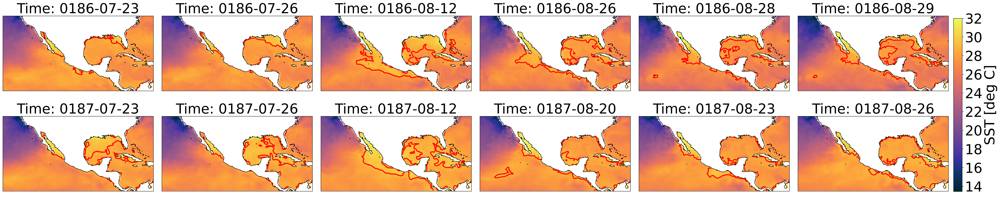

In [137]:
# ocetrac output figure for paper
days_row1 = ['0186-07-23','0186-07-26', '0186-08-12', '0186-08-26', '0186-08-28', '0186-08-29']
days_row2 = ['0187-07-23','0187-07-26', '0187-08-12', '0187-08-20', '0187-08-23', '0187-08-26']
#days_row3 = ['0188-07-25', '0188-07-26', '0188-08-12', '0188-08-23', '0188-08-24']
#days_row4 = ['0189-07-25', '0189-07-26', '0189-08-12', '0189-08-23', '0189-08-24']

all_days = days_row1 + days_row2 #+ days_row3 + days_row4

ids_sel = np.unique(labels.sel(time=slice(all_days[0], all_days[-1])))
ids_sel = np.array([id for id in ids_sel if ~np.isnan(id)])
#vmincbar = np.min(ids_allyears).astype(int)
#vmaxcbar = np.max(ids_allyears).astype(int)
vmin = np.min(ids_sel).astype(int)
vmax = np.max(ids_sel).astype(int)

cmap = ListedColormap(np.random.rand(vmax - vmin + 1, 3))#len(np.random.rand((vmax - vmin)/5, 3))np.random.rand(vmax - vmin + 1, 3)
#cmap = ListedColormap(sns.color_palette("hls",int(ids_allyears[0])))
#cmap = ListedColormap(np.random.random(size=(int(len(ids_sel)), 3)).tolist())

fig, axes = plt.subplots(
    nrows=2, ncols=6, figsize=(40, 8), dpi=300, subplot_kw={'projection': ccrs.PlateCarree()} #figsize=(24, 10) for 4 rows
)
axes = axes.flatten()

for ax, day in zip(axes, all_days):

    p = ds_region.tos.sel(time=day).plot(ax=ax,cmap=cmocean.cm.thermal,vmax=32,add_colorbar=False)

    pc = ds_region.tos.isel(time=ds_region.time.get_index("time").get_loc(day).start).plot.contour(ax=ax,
    levels=[29],
    colors='r',
    linewidths=2.5,
    linestyles='solid')
    
    # plot = labels.sel(time=day).plot(
    #     ax=ax,
    #     cmap=cmap,
    #     transform=ccrs.PlateCarree(),
    #     add_colorbar=False,
    #     vmin=vmin,
    #     vmax=vmax
    # )
    
    #labels.isel(time=labels.time.get_index("time").get_loc(day).start).plot.contour(ax=ax,levels=[0.5],colors='r', linewidths=1,linestyles='solid')

    ax.set_xlim([-130, -70])
    ax.set_ylim([8, 38])
    ax.coastlines()

    ax.set_title(f"Time: {day}", fontsize=35)
    
plt.subplots_adjust(hspace=0.05)

cbar = fig.colorbar(p, ax=axes, orientation='vertical', fraction=0.07, pad=0.1,ticks=np.arange(14,33,2))
cbar.set_label('SST [deg C]', fontsize=35)
cbar.ax.tick_params(labelsize=35)

fig.tight_layout(rect=[0, 0.002, 0.845, 1])

#plt.savefig('/pub/mariant3/WarmWaterMasses/figures/paper/ocetrac-output-labels-186-187-tos-t1-v1.png', bbox_inches='tight')
plt.show()

In [12]:
# ocetrac output figure for paper
days_row1 = ['0186-07-10', '0186-07-13', '0186-08-14', '0186-08-15', '0186-08-16', '0186-08-17']
#days_row1 = ['0186-07-23','0186-07-26', '0186-08-12', '0186-08-26', '0186-08-28', '0186-08-29']
days_row2 = ['0186-07-23', '0186-07-26', '0186-08-12', '0186-08-21', '0186-08-25', '0186-08-31']
#days_row2 = ['0187-07-23','0187-07-26', '0187-08-12', '0187-08-26', '0187-08-28', '0187-08-29']
days_row3 = ['0187-07-17', '0187-07-18', '0187-08-19', '0187-08-20', '0187-08-21', '0187-08-22']
days_row4 = ['0187-07-23', '0187-07-26', '0187-08-12', '0187-08-21', '0187-08-25', '0187-08-31']

all_days = days_row1 + days_row2 + days_row3 + days_row4

ids_sel = np.unique(labels.sel(time=slice(all_days[0], all_days[-1])))
ids_sel = np.array([id for id in ids_sel if ~np.isnan(id)])
#vmincbar = np.min(ids_allyears).astype(int)
#vmaxcbar = np.max(ids_allyears).astype(int)
vmin = np.min(ids_sel).astype(int)
vmax = np.max(ids_sel).astype(int)

cmap = ListedColormap(np.random.rand(vmax - vmin + 1, 3))#len(np.random.rand((vmax - vmin)/5, 3))np.random.rand(vmax - vmin + 1, 3)
#cmap = ListedColormap(sns.color_palette("hls",int(ids_allyears[0])))
#cmap = ListedColormap(np.random.random(size=(int(len(ids_sel)), 3)).tolist())

fig, axes = plt.subplots(
    nrows=4, ncols=6, figsize=(40, 20), dpi=300, subplot_kw={'projection': ccrs.PlateCarree()} #figsize=(24, 10) for 4 rows
)
axes = axes.flatten()

for ax, day in zip(axes, all_days):

    
    p = ds_region.tos.sel(time=day).plot(ax=ax,cmap=cmocean.cm.thermal,vmax=32,add_colorbar=False)

    pc = ds_region.tos.isel(time=ds_region.time.get_index("time").get_loc(day).start).plot.contour(ax=ax,
    levels=[29],
    colors='r',
    linewidths=2.5,
    linestyles='solid')
    
    plot = labels.sel(time=day).plot(
        ax=ax,
        cmap=cmap,
        transform=ccrs.PlateCarree(),
        add_colorbar=False,
        vmin=vmin,
        vmax=vmax
    )
    
    #labels.isel(time=labels.time.get_index("time").get_loc(day).start).plot.contour(ax=ax,levels=[0.5],colors='r', linewidths=1,linestyles='solid')

    ax.set_xlim([-130, -70])
    ax.set_ylim([8, 38])
    ax.coastlines()

    ax.set_title(f"Time: {day}", fontsize=35)
    
plt.subplots_adjust(hspace=0.05)

cbar = fig.colorbar(p, ax=axes, orientation='vertical', fraction=0.07, pad=0.1,ticks=np.arange(14,33,2))
cbar.set_label('SST [deg C]', fontsize=35)
cbar.ax.tick_params(labelsize=35)

# cbar = fig.colorbar(
#     plot, ax=axes, orientation='vertical', fraction=0.07, pad=0.1,
#     ticks=ids_allyears
# )
# cbar.set_label('Event label', fontsize=35)
# cbar.ax.tick_params(labelsize=35)

fig.tight_layout(rect=[0, 0.002, 0.845, 1])

#plt.savefig(f'/pub/mariant3/WarmWaterMasses/figures/paper/ocetrac-output-labels-{days_row1[0]}-{days_row1[-1]}-t1-v1-cT.png', bbox_inches='tight')
plt.show()

In [34]:
id = 107
event = labels.where(labels==id, drop=True)
event.shape
event;

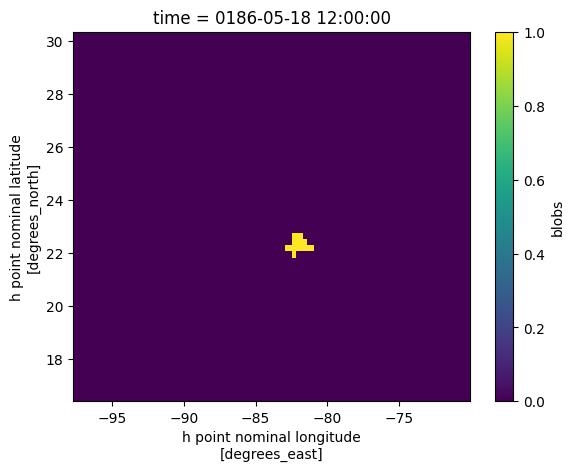

In [35]:
event_mask = event == event
event_mask.isel(time = 0).plot()

In [ ]:
id = 107
event = labels.where(labels==id, drop=True)

time_steps = event.time.size
cols = 5
rows = (time_steps + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 3.5 * rows), subplot_kw={'projection': ccrs.PlateCarree()})

axes = axes.flatten()

for time in range(time_steps):
    ds_static_region.tos.sel(time=event.time[time].values).where(event_mask.sel(time=event.time[time].values)).plot(
        ax=axes[time],
        levels=np.arange(28, 31.6, 0.2),
        colors=cmo.thermal,
        add_colorbar=True
    )

    axes[time].coastlines()
    # Set the title for each subplot
    axes[time].set_title(f"Time: {event.time.values[time]}")


for idx in range(time_steps, len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()

plt.show()

In [ ]:
# Define specific IDs and dates
ids = [25, 26, 32]
dates = ['0186-07-25', '0186-07-26', '0186-08-12', '0186-08-23', '0186-08-24']

# Filter for specific IDs and dates
event = labels.where(labels.isin(ids) & labels.time.isin(dates), drop=True)

# Define the number of columns (5) and rows (1)
fig, axes = plt.subplots(1, 5, figsize=(20, 5), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()

# Set color levels and colormap
levels = np.arange(28, 31.6, 0.2)
cmap = cmocean.cm.thermal

# Iterate over each specified date to plot the corresponding event
for i, time in enumerate(dates):
    event_for_time = event.sel(time=time)
    if not event_for_time.isnull().all():  # Check if there's data for the current time
        plot = ds_static_region.tos.sel(time=time).where(event_for_time).plot(
            ax=axes[i],
            levels=levels,
            cmap=cmap,
            add_colorbar=False  # Disable individual colorbars
        )
        axes[i].coastlines()
        axes[i].set_title(f"Time: {time}")

# Add a single colorbar for the entire figure
cbar = fig.colorbar(plot, ax=axes, orientation='vertical', fraction=0.02, pad=0.02)
cbar.set_label('Temperature (°C)', fontsize=12)

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 0.95, 1])  # Leaves space for colorbar on the right
plt.show()


In [9]:
#quick fix for date issues
dates_evo = {
    'day1': (186, 6, 30),
    'day2': (186, 7, 15),
    'day3': (186, 7, 26), #206
    'i3': 206,
    'day4': (186, 8, 3),
    'day5': (186, 8, 10), #221
    'i5': 221,
    'day6': (186, 8, 21), #232
    'i6': 232,
    'day7': (186, 8, 28), #239
    'i7': 239,
    'day8': (186, 9, 5),
    'day9': (186, 9, 15),
    'day10': (186, 9, 30),
    'day11': (186, 10, 5),
    'day12': (186, 10, 15),
}

def cftime_string(date_tuple):
    year, month, day = date_tuple
    return f"{year:04d}-{month:02d}-{day:02d}"

In [50]:
i = 7
day = f'day{i}'
day_save = dates_evo[f'{day}']
date_save = cftime_string(day_save)
date_save

'0186-08-28'

In [51]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cftime
import numpy as np
import cmocean.cm as cmo

def plot_event_mask(event_mask, ds_static_region, labels, year, month, day, save_path=None, cbarlabelsize=12, fontsize=12):
    plt.figure(figsize=(20, 9),facecolor='#faf8eb')

    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.LAND, facecolor='#faf8eb')
    #ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
    y=28

    #select the date of interest
    date_sel = cftime.DatetimeNoLeap(year, month, day)
    
    event_mask_time = event_mask.sel(time=date_sel, method="nearest")

    #ds_static_region.sel(time=date_sel, method="nearest").sel(yh=slice(18, 32)).sel(xh=slice(-98, -75)).plot(vmin=22, vmax=29, cmap="Blues_r")

    #ds_static_region.tos.sel(time=date_sel, method="nearest").sel(yh=slice(18, 32)).sel(xh=slice(-98, -75)).plot(levels=np.arange(27, 28, 0.2),
                                                                                                   # colors="Blues_r", #colors=cmocean.cm.thermal, 
                                                                                                  #  add_colorbar=True)

    i = 7
    S = ds_static_region.tos.isel(time=dates_evo[f'i{i}']).plot(levels=np.arange(25, 29, 0.2), vmin=28, vmax=29 ,colors='Blues',add_colorbar=False) #levels=np.arange(25, 28, 0.5)

    Sc = ds_static_region.tos.isel(time=dates_evo[f'i{i}']).plot.contour(levels=np.arange(28, 28.5, 0.5),
                                       colors='#faf8eb',
                                       linewidths=1,
                                       linestyles='solid')
    
    plot = (ds_static_region.tos.sel(time=date_sel, method="nearest")
                         .where(event_mask.sel(time=date_sel, method="nearest"))
                         .plot(levels=np.arange(28, 31.6, 0.2),
                               colors=cmo.thermal, 
                               add_colorbar=False))

    C = (ds_static_region.tos.sel(time=date_sel, method="nearest")
                         .where(event_mask.sel(time=date_sel, method="nearest"))
                         .plot.contour(levels=np.arange(28, 33, 0.5),
                                       colors='#faf8eb',
                                       linewidths=1,
                                       linestyles='solid'))

    plt.clabel(C, inline=True, fontsize=17)
    plt.clabel(Sc, inline=True, fontsize=17, colors='#faf8eb')

   

    # Add contour lines for event_mask data
    C_event_mask = event_mask_time.plot.contour(levels=[0.6], colors='#89CC04', linewidths=5.5, linestyles='-') ##c53f4e

    date_temp = labels.sel(time=date_sel, method="nearest").time.dt.strftime('%Y-%m-%d').values

    ax.set_title(f'Date: {date_temp}', fontsize=fontsize)
    ax.set_xlim([-98, -75])
    ax.set_ylim([18, 32])
    
    gl = ax.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
   
    gl.xlabel_style = {'size': 16}
    gl.ylabel_style = {'size': 16}
    plt.axhline(y=y, color='#89CC04', linestyle='--',linewidth=3)
    #plt.axhline(y=22, color='k', linestyle='--')

    colorbar2 = plt.colorbar(S, ax=ax)
    colorbar2.set_label(r'SST [$^{\circ}$C]', fontsize=fontsize)
    colorbar2.ax.tick_params(labelsize=cbarlabelsize)

    # Add a colorbar for the mappable object
    colorbar = plt.colorbar(plot, ax=ax)
    colorbar.set_label(r'MHW SST [$^{\circ}$C]', fontsize=fontsize)
    colorbar.ax.tick_params(labelsize=cbarlabelsize)

   # plt.tight_layout()


    # Change colorbar font size
    # cbar = plot.colorbar
    # cbar.ax.tick_params(labelsize=cbarlabelsize) 
    # cbar.set_label(r'SST [$^{\circ}$C]', fontsize=fontsize)
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    else:
        plt.show()
        

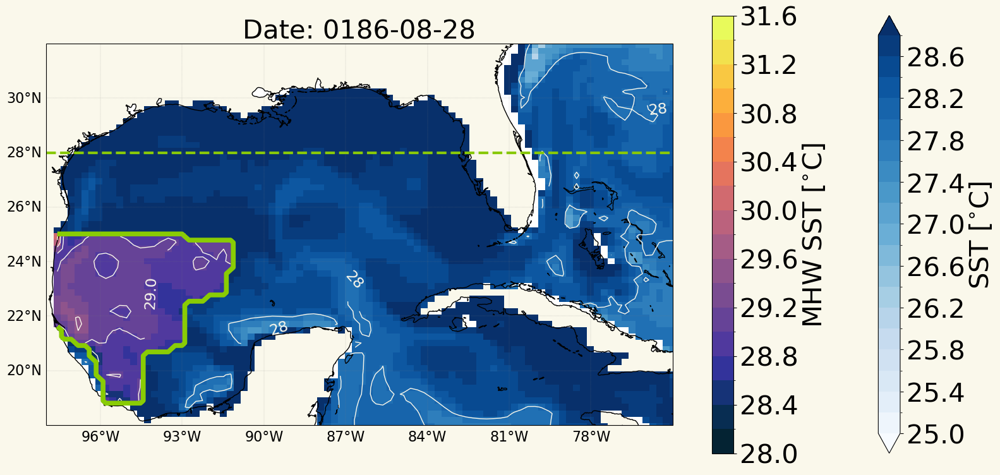

In [52]:
y=28

plot_event_mask(event_mask,
                ds_static_region,
                labels,
                dates_evo[f'{day}'][0],
                dates_evo[f'{day}'][1],
dates_evo[f'{day}'][2],
cbarlabelsize=30,
fontsize=30,
save_path=False) #f'/pub/mariant3/WarmWaterMasses/figures/mhw-2d-{date_save}-{y}N-colorbar-sst.png')
